|No.| Column    | Description|
|---| ---       | ---         |
|1| `respondent_id` | Unique and random identifier for the respondents|
|2|`h1n1_concern`| Level of concern about H1N1 flu with 0 being not concerned at all and 3 being very concerned|
|3|`h1n1_knowledge`| Level of knowledge about H1N1 with 0 being no knowledge and 2 being a lot of knowledge|
|4|`behavioral_antiviral_meds`| Has taken any antiviral medication (0-no,1-yes)|
|5|`behavioral_avoidance`| Has avoided close contact with anyone with flu-like symptoms (0-no,1-yes)|
|6|`behavioral_face_mask`| Has bought a face mask (0-no,1-yes)|
|7|`behavioral_wash_hands`| Has frequently washed hands or used hand sanitizer (0-no,1-yes)|
|8|`behavioral_large_gatherings`| Has reduced time at large gatherings (0-no,1-yes)|
|9|`behavioral_outside_home`| Has reduced contact with people outside of own household (0-no,1-yes)|
|10|`behavioral_touch_face`| Has avoided touching eyes, nose or mouth (0-no,1-yes)|
|11|`doctor_recc_h1n1`| H1N1 flu vaccine was recommended by doctor (0-no,1-yes)|
|12|`doctor_recc_seasonal`| H1N1 flu vaccine was recommended by doctor (0-no,1-yes)|
|13|`chronic_med_condition`| Has any of the following chronic conditions: asthma or any lung condition, a heart condition, a kidney condition, sickle cell anaemia or any other anaemia, a neurological or neouromuscular condition, a liver condition, or a weakened immune system as a result of a chronic illness or medicines taken for a chronic illness (0-no,1-yes)|
|14|`child_under_6_months`| Has regular close contact with a child under the age of six months (0-no,1-yes)|
|15|`health_worker`| Is a healthcare worker (0-no,1-yes)|
|16|`health_insurance`| Has health insurance (0-no,1-yes)|
|17|`opinion_h1n1_vacc_effective`| Respondent's opinion on the efficacy of the vaccine with 1 being not at all effective and 5 being very effective|
|18|`opinion_h1n1_risk`| Respondent's opinion about risk of getting sick with H1N1 flu without vaccine with 1 being very low and 5 being very high|
|19|`opinion_h1n1_sick_from_vacc`| Respondent's worry of getting sick from H1N1 vaccine with 1 being not worried at all and 5 being very worried|
|20|`opinion_seas_vacc_effective`| Respondent's opinion about seasonal flu vaccine effectiveness with 1 being not effective at all and 5 being very effective|
|21|`opinion_seas_risk`| Respondent's opinion about risk of getting sick with seasonal flu without vaccine with 1 being very low and 5 being very high|
|22|`opinion_seas_sick_from_vacc`| Respondent's worry of getting sick from taking seasonal flu vaccine with 1 being not worried at all and 5 being very worried|
|23|`age_group`| Age group of respondents|
|24|`education`| Self-reported educational level|
|25|`race`| Race of respondent|
|26|`sex`| Sex of respondent|
|27|`income_poverty`| Household annual income of respondent with respect to 2008 Census poverty thresholds|
|28|`marital status`| Marital status of respondent|
|29|`rent_or_own`| Housing situation of respondent|
|30|`employment_status`| Employment status of respondent|
|31|`hhs_geo_region`| Respondent's residence using a 10-region geographic classification defined by the U.S. Dept. of Health and Human Services. Values are represented as short random character strings|
|32|`census_msa`| Respondent's residence within metropolitan statistical areas (MSA) as defined by the U.S. Census|
|33|`household_adults`| Number of *other* adults in the household, top-coded to 3|
|34|`household_children`| Number of children in the household, top-coded to 3|
|35|`employment_industry`| Type of industry respondent is employed in. Values are represented as short random character strings|
|36|`employment_occupation`| Type of occupation of respondent.Values are represented as short random character strings| 

In [114]:
# importing relevant libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,roc_auc_score,ConfusionMatrixDisplay,classification_report
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.feature_selection import RFECV
from sklearn.ensemble import GradientBoostingClassifier
import joblib    
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import  KFold



In [82]:
# Load the CSV file with setting an index

df = pd.read_csv('H1N1_Flu_Vaccines.csv', index_col='respondent_id')

In [83]:
# viewing all our columns 

pd.set_option('display.max_columns', 100)


In [84]:
# viewing our first five rows

df.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
respondent_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [85]:
# getting basic data info

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26707 entries, 0 to 26706
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   h1n1_concern                 26615 non-null  float64
 1   h1n1_knowledge               26591 non-null  float64
 2   behavioral_antiviral_meds    26636 non-null  float64
 3   behavioral_avoidance         26499 non-null  float64
 4   behavioral_face_mask         26688 non-null  float64
 5   behavioral_wash_hands        26665 non-null  float64
 6   behavioral_large_gatherings  26620 non-null  float64
 7   behavioral_outside_home      26625 non-null  float64
 8   behavioral_touch_face        26579 non-null  float64
 9   doctor_recc_h1n1             24547 non-null  float64
 10  doctor_recc_seasonal         24547 non-null  float64
 11  chronic_med_condition        25736 non-null  float64
 12  child_under_6_months         25887 non-null  float64
 13  health_worker   

## <span style= 'color : cyan'>  Data Cleaning </span>

In [165]:
# getting the shape of our data

print('rows :', df.shape[0])
print('columns :', df.shape[1])


rows : 26707
columns : 37


#### `checking for duplicate values`

In [166]:
# checking for duplicated values

print ('duplicated :' , df.duplicated().sum())

duplicated : 0


#### `checking for null values`

In [88]:
df.isna().sum().sort_values(ascending = False)

employment_occupation          13470
employment_industry            13330
health_insurance               12274
income_poverty                  4423
doctor_recc_seasonal            2160
doctor_recc_h1n1                2160
rent_or_own                     2042
employment_status               1463
marital_status                  1408
education                       1407
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
opinion_seas_sick_from_vacc      537
opinion_seas_risk                514
opinion_seas_vacc_effective      462
opinion_h1n1_sick_from_vacc      395
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
household_adults                 249
household_children               249
behavioral_avoidance             208
behavioral_touch_face            128
h1n1_knowledge                   116
h1n1_concern                      92
behavioral_large_gatherings       87
behavioral_outside_home           82
b

#### `handling null values`

To handle our null values wwe will use the simple imputer

* Data was split to categorical and numerical values
  #
* Each split is treated differently with numerical columns we used *`most frequent`* since this will preserve the overall distribution of categorical data
  #
* Categorical columns we used *`most frequent`* as the strategy since most of our values are repetitive classes

In [169]:
# Handling null values

data_num = df.select_dtypes(exclude= 'object')

# instantiate imputer

imputer = SimpleImputer(missing_values= np.nan, strategy= 'most_frequent')

# fit and transform our numerical values

data_num.iloc[:,:] = imputer.fit_transform(data_num)


In [170]:
# instantiate imputer

imputer2 = SimpleImputer(missing_values= np.nan, strategy= 'most_frequent')

data_cat =df.select_dtypes(include= 'object')

# fit and transform our categorical values

data_cat.iloc[:,:] = imputer2.fit_transform(data_cat)


#### `Encoding our data using Ordical Encoder`

* For encoding *`Ordinal Encoder`* is suitable for our data set since our values have no specific order
 #
* That is there is no hierarchical relationship in our features values

In [171]:
from sklearn.preprocessing import OrdinalEncoder

# Create an instance of the OrdinalEncoder

encoder = OrdinalEncoder()

# Fitting , transforming and passing it into a data frame

X_encoded_df = pd.DataFrame(encoder.fit_transform(data_cat))

# Naming our columns

X_encoded_df.columns = data_cat.columns


#### `Concatenating the data frames into one data frame called  new_df`

In [172]:
new_df  = pd.concat([data_num, X_encoded_df], axis =1)


## <span style = 'color : cyan' > EXPLORATORY DATA ANALYSIS </span>


### <span style = 'color : orange' > 1. UNIVARIATE ANALYSIS OF OUR CATEGORICAL FEATURES </span>


This is to show the distribution of our features and which groups are highly or less represented in our data set

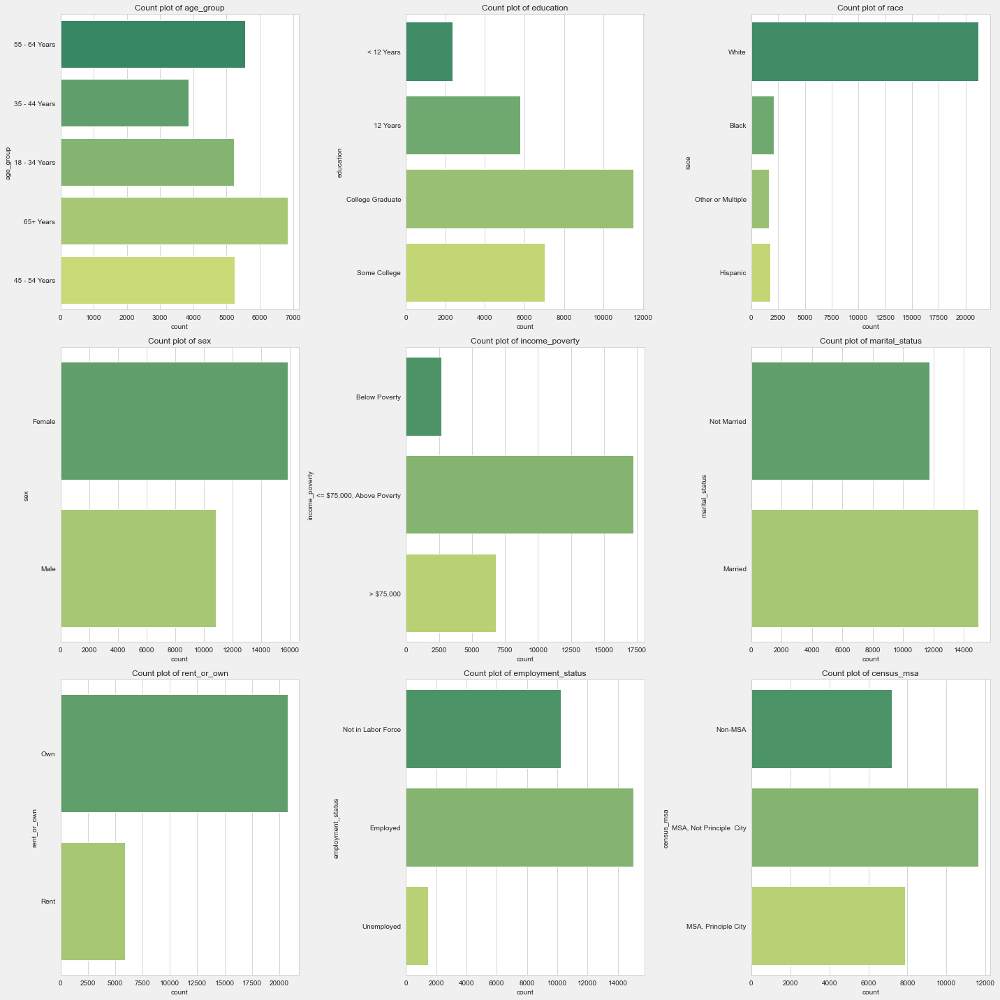

In [173]:
# dropping the columns that will not be used for this visualization

data_cat = data_cat.drop(['employment_industry', 'employment_occupation', 'hhs_geo_region'], axis=1)

#getting the columns for the plot

count_plot = data_cat.columns

# Setting the  size and axes of my visualization

fig, axes = plt.subplots(nrows=3 , ncols=3, figsize=(20, 20))

fig.patch.set_facecolor('#F0F0F0') 

# Iterate over the columns and corresponding axes
for column, ax in zip(count_plot, axes.flatten()):
    sns.countplot(data=data_cat, y=column, ax=ax, palette="summer")
    ax.set_title(f'Count plot of {column}')

# plotting the graph

plt.tight_layout()
plt.show()

## `choose seasonal_vaccine coz h1n1 is imbalanced`

In [174]:

# Create subplots with titles
fig = make_subplots(rows=3, cols=3, subplot_titles=('Race', 'Sex', 'Education', 'Age Group', 'Marital Status', 'HHS Geo Region', 'Health Worker', 'Health Insurance'))

# Define variables and titles
variables = ['race', 'sex', 'education', 'age_group', 'marital_status', 'hhs_geo_region', 'health_worker', 'health_insurance']
titles = ['Race', 'Sex', 'Education', 'Age Group', 'Marital Status', 'HHS Geo Region', 'Health Worker', 'Health Insurance']

# Loop through the variables and add violin plots to the subplots
for i, var in enumerate(variables):
    row = (i // 3) + 1
    col = (i % 3) + 1
    fig.add_trace(go.Violin(x=df[var], y=df['seasonal_vaccine'], name=titles[i]), row=row, col=col)

# Update the layout
fig.update_layout(height=1100, width=1100, title_text="Violin Subplots", template="simple_white")

# Show the figure
fig.show()

In [175]:
import plotly.express as px

# creating 3-d graph
fig = px.scatter_3d(
    x=df['seasonal_vaccine'], y=df['sex'], z=df['race'], color=df['seasonal_vaccine'],
    title="3-graph"
)
fig.show()

#### `Getting the best Features for our  models using chi2 `

In [176]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

x = new_df.drop(['h1n1_vaccine', 'seasonal_vaccine'], axis=1)
y = new_df['seasonal_vaccine']

In [177]:
# apply select k best to extract best features

best_features = SelectKBest(chi2, k=15)

fit = best_features.fit(x,y)

scores = pd.DataFrame([])

# fit the

In [178]:
# Importing necessary modules for feature selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Set the Target and Independent variable

X = new_df.drop(['h1n1_vaccine', 'seasonal_vaccine'], axis=1) # Independent Variable
y = new_df.seasonal_vaccine # Target Variable

# Apply select K best to extract best features 
best_features = SelectKBest(chi2,k=15)
fit = best_features.fit(X, y)

scores = pd.DataFrame(fit.scores_)
x_columns= pd.DataFrame(X.columns)

feature_score = pd.concat([x_columns,scores], axis=1)
feature_score.columns =['feature_data1','scores']
feature_score

,feature_data1,scores
0,h1n1_concern,325.148276
1,h1n1_knowledge,115.652237
2,behavioral_antiviral_meds,0.918545
3,behavioral_avoidance,42.141343
4,behavioral_face_mask,62.214095
5,behavioral_wash_hands,58.594846
6,behavioral_large_gatherings,69.677957
7,behavioral_outside_home,50.332544
8,behavioral_touch_face,123.369866
9,doctor_recc_h1n1,839.733852


In [179]:
final_features = feature_score.nlargest(20, 'scores')

In [180]:
# final features

final_features

,feature_data1,scores
19,opinion_seas_risk,2794.888237
10,doctor_recc_seasonal,2421.579654
23,age_group,1997.217625
33,employment_industry,1669.849661
18,opinion_seas_vacc_effective,991.273021
16,opinion_h1n1_risk,866.169464
9,doctor_recc_h1n1,839.733852
11,chronic_med_condition,557.625394
22,household_children,538.442999
13,health_worker,383.862558


In [181]:
# selecting features

columns_to_include = final_features['feature_data1'].tolist()

In [182]:
columns_to_include.append('seasonal_vaccine')


In [183]:
columns_to_include

['opinion_seas_risk',
 'doctor_recc_seasonal',
 'age_group',
 'employment_industry',
 'opinion_seas_vacc_effective',
 'opinion_h1n1_risk',
 'doctor_recc_h1n1',
 'chronic_med_condition',
 'household_children',
 'health_worker',
 'h1n1_concern',
 'opinion_h1n1_vacc_effective',
 'rent_or_own',
 'behavioral_touch_face',
 'h1n1_knowledge',
 'sex',
 'race',
 'opinion_seas_sick_from_vacc',
 'household_adults',
 'behavioral_large_gatherings',
 'seasonal_vaccine']

In [184]:
final_df = new_df[columns_to_include]


In [185]:
final_df.head()

,opinion_seas_risk,doctor_recc_seasonal,age_group,employment_industry,opinion_seas_vacc_effective,opinion_h1n1_risk,doctor_recc_h1n1,chronic_med_condition,household_children,health_worker,h1n1_concern,opinion_h1n1_vacc_effective,rent_or_own,behavioral_touch_face,h1n1_knowledge,sex,race,opinion_seas_sick_from_vacc,household_adults,behavioral_large_gatherings,seasonal_vaccine
0,1.0,0.0,3.0,4.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,3.0,2.0,0.0,0.0,0.0
1,2.0,0.0,1.0,12.0,4.0,4.0,0.0,0.0,0.0,0.0,3.0,5.0,1.0,1.0,2.0,1.0,3.0,4.0,0.0,0.0,1.0
2,1.0,0.0,0.0,14.0,4.0,1.0,0.0,1.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,1.0,3.0,2.0,2.0,0.0,0.0
3,4.0,1.0,4.0,4.0,5.0,3.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,0.0,1.0,0.0,3.0,1.0,0.0,1.0,1.0
4,1.0,0.0,2.0,18.0,3.0,3.0,0.0,0.0,0.0,0.0,2.0,3.0,0.0,1.0,1.0,0.0,3.0,4.0,1.0,1.0,0.0


In [186]:
# this is our final data frame

final_df.shape

(26707, 21)

## `BASE MODEL`

### DECISION TREE

In [187]:
X = final_df.drop('seasonal_vaccine', axis=1)
Y= final_df['seasonal_vaccine']

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size= 0.2, stratify=Y, random_state=0)

Model Train accuracy: 0.997
Model Test accuracy: 0.683
Cross Validation Accuracy: 68.2658%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.71      0.70      0.70      2855
         1.0       0.66      0.67      0.66      2487

    accuracy                           0.68      5342
   macro avg       0.68      0.68      0.68      5342
weighted avg       0.68      0.68      0.68      5342



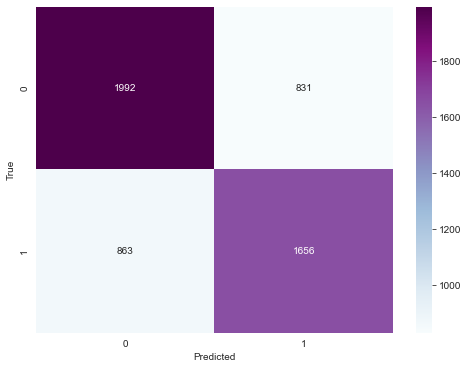

In [188]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


# setting my pipeline

scaled_pipeline = Pipeline([('scaler' , StandardScaler()),
                            ('tree', DecisionTreeClassifier())])
cv = 10
# setting basic parameter
grid = [{'tree__criterion': ['entropy'], 
         }]

gridsearch = GridSearchCV(estimator=scaled_pipeline, 
                          param_grid= grid,
                          scoring='accuracy', 
                          cv=cv)

# training and fitting

def fit_train_score(model):
    
    model.fit(X_train,y_train)

    # predicting with X_test

    y_test_pred = model.predict(X_test)

    #accuracy score of the model on the training set.

    y_train_pred = model.predict(X_train)

    #accuracy score of the model on the training set.

    accuracy_train = accuracy_score(y_train_pred,y_train)

    # the accuracy score of the model on the test set.

    accuracy_test = accuracy_score(y_test_pred, y_test)
    
    # performing cross validation
    cross_val = cross_val_score(model,X_train,y_train,cv = cv)
    
    # Printing the scores
    print(f'Model Train accuracy: {accuracy_train:.3f}')
    print(f'Model Test accuracy: {accuracy_test:.3f}')
    print(f"Cross Validation Accuracy: {round(cross_val.mean()*100,4)}%")
    
    # creating confusion matrix
    from sklearn.metrics import confusion_matrix
    cm = confusion_matrix(y_test,y_test_pred)
    
    # Making the Confusion Matrix
    plt.figure(figsize=(8, 6))
    
    cm = confusion_matrix(y_test_pred, y_test)
    
    ax = sns.heatmap(cm,annot=True, fmt= 'd', cmap = 'BuPu')
    
     # Add labels to the x and y axes
     
    ax.set_xlabel('Predicted')
    
    ax.set_ylabel('True')
   
    plt.savefig('confusion.png')
    
    print('\n')
    
    print ('***********************************', '\n')
    
    # printing the report
    
    print(classification_report(y_test, y_test_pred))
    
    
def learning_curve(model):
    
    # Plotting the learning curve
    
    from sklearn.model_selection import  learning_curve

    train_sizes, train_scores, test_scores = learning_curve(
        model, X_train, y_train, cv=cv, scoring='accuracy')
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)
    
    plt.figure(figsize=(10, 8))
    plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training score')
    plt.fill_between(
        train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='r')
    plt.plot(train_sizes, test_mean, 'o-', color='g', label='Validation score')
    plt.fill_between(
        train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='g')
    plt.xlabel('Training examples')
    plt.ylabel('Score')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
        

fit_train_score(gridsearch)

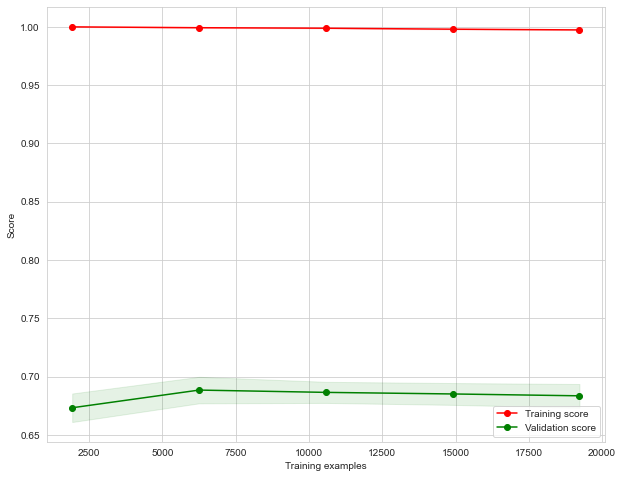

In [189]:
# plotting the learning curve

learning_curve(gridsearch)

### <span style ='color : orange ' > Random Forest Classifier </span>

Model Train accuracy: 0.776
Model Test accuracy: 0.774
Cross Validation Accuracy: 76.85%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.77      0.82      0.79      2855
         1.0       0.78      0.72      0.75      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.77      0.77      5342
weighted avg       0.77      0.77      0.77      5342



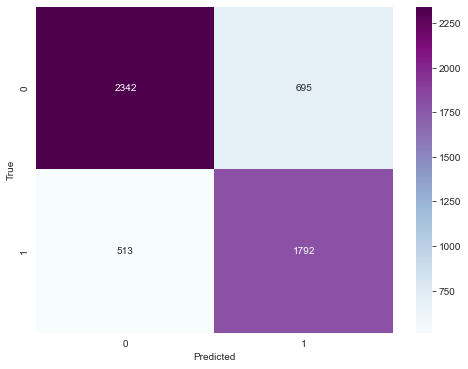

In [190]:
# importing the necessary library

from sklearn.ensemble import RandomForestClassifier

# defining our pipeline

scaled_pipeline1 = Pipeline([('scaler' , StandardScaler()),
                            ('tree1', RandomForestClassifier())])
# setting our cv

cv= 6

# setting basic parameter

grid = [{'tree1__n_estimators' : [len(range(1,120))],
         'tree1__criterion': ['gini', 'entropy'],
         'tree1__max_depth': [2,3,4,5,6]}]

# Setting up the grid search

gridsearch1 = GridSearchCV(estimator=scaled_pipeline1, 
                          param_grid= grid,
                          scoring='accuracy', 
                          cv=cv)

fit_train_score(gridsearch1)

In [191]:
# getting the best parameters of the random tree classifier

gridsearch1.best_params_

{'tree1__criterion': 'entropy',
 'tree1__max_depth': 6,
 'tree1__n_estimators': 119}

### <span style ='color : orange ' > Random Forest Classifier with best parameters</span>

Model Train accuracy: 0.776
Model Test accuracy: 0.777
Cross Validation Accuracy: 76.9717%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.78      0.82      0.80      2855
         1.0       0.78      0.73      0.75      2487

    accuracy                           0.78      5342
   macro avg       0.78      0.77      0.77      5342
weighted avg       0.78      0.78      0.78      5342



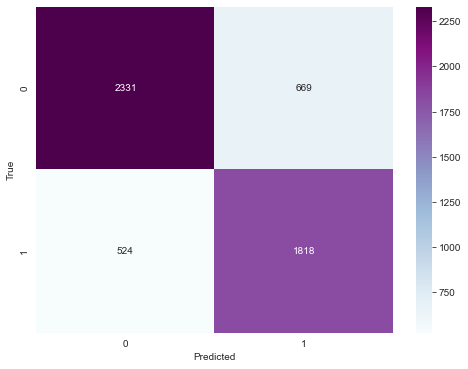

In [192]:
# setting the best parameters for our random tree classifier

grid = [{'tree1__n_estimators' : [119],
         'tree1__criterion': ['gini'],
         'tree1__max_depth': [6]}]

# setting the cv to 5

cv= 6

# setting the grid search 

gridsearch1 = GridSearchCV(estimator=scaled_pipeline1, 
                          param_grid= grid,
                          scoring='accuracy', 
                          cv=cv)

# training and fitting the model

fit_train_score(gridsearch1)

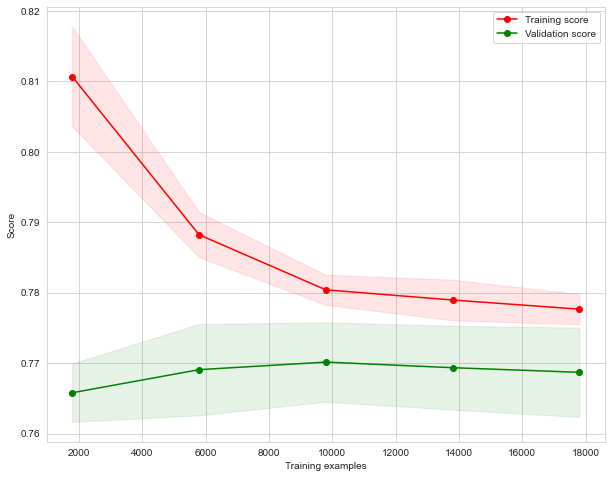

In [193]:
# plotting the learning curve

learning_curve(gridsearch1)

### <span style ='color : orange ' > Gradient Boosting Classifier</span>

Model Train accuracy: 0.780
Model Test accuracy: 0.776
Cross Validation Accuracy: 77.7159%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79      2855
         1.0       0.77      0.75      0.76      2487

    accuracy                           0.78      5342
   macro avg       0.78      0.77      0.77      5342
weighted avg       0.78      0.78      0.78      5342



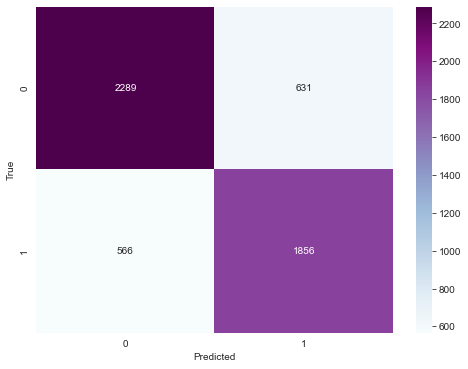

In [194]:
# importing the required module

from sklearn.ensemble import GradientBoostingClassifier

# initializing the pipeline

scaled_pipeline2 = Pipeline([('scaler' , StandardScaler()),
                            ('gradient', GradientBoostingClassifier())])

cv= 5
# setting basic parameter
grid2 = [{'gradient__loss' : ['log_loss', 'deviance'],
         'gradient__learning_rate': [0.1, 0.2, 0.3],
         'gradient__n_estimators': [len(range(80,100))]}]

gridsearch2 = GridSearchCV(estimator=scaled_pipeline2, 
                          param_grid= grid2,
                          scoring='accuracy', 
                          cv=cv)

fit_train_score(gridsearch2)

In [195]:
gridsearch2.best_params_

{'gradient__learning_rate': 0.3,
 'gradient__loss': 'log_loss',
 'gradient__n_estimators': 20}

### <span style ='color : orange ' > Gradient Boosting Classifier with best parameters</span>

Model Train accuracy: 0.780
Model Test accuracy: 0.776
Cross Validation Accuracy: 77.7159%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79      2855
         1.0       0.77      0.75      0.76      2487

    accuracy                           0.78      5342
   macro avg       0.78      0.77      0.77      5342
weighted avg       0.78      0.78      0.78      5342



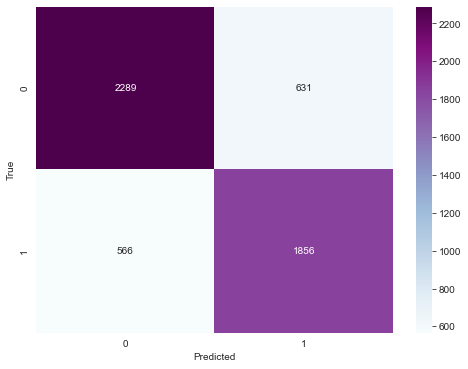

In [196]:
# setting the cv

cv= 5

# setting best parameters

grid2 = [{'gradient__loss' : ['log_loss'],
         'gradient__learning_rate': [0.3],
         'gradient__n_estimators': [20]}]

# setting the grid search

gridsearch_best = GridSearchCV(estimator=scaled_pipeline2, 
                          param_grid= grid2,
                          scoring='accuracy', 
                          cv=cv)

# fitting and training the model

fit_train_score(gridsearch_best)

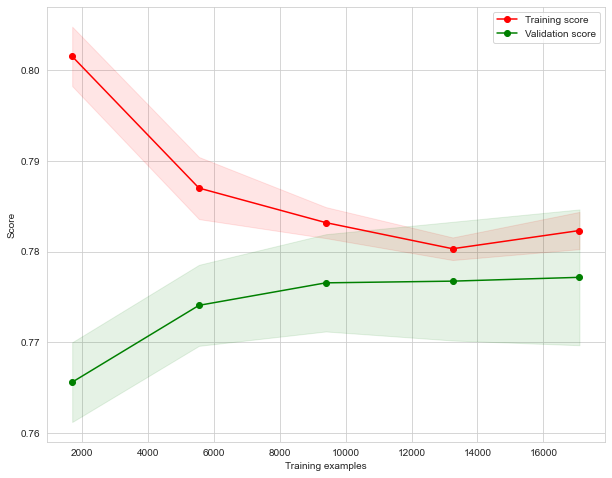

In [197]:
# plotting the learning curve

learning_curve(gridsearch_best)

### <span style ='color : orange ' > ADABoost Classifier</span>

In [198]:
# ADA BOOSTING

from sklearn.ensemble import AdaBoostClassifier

# setting the pipeline

scaled_pipeline3 = Pipeline([('scaler' , StandardScaler()),
                            ('ADA', AdaBoostClassifier())])

# setting basic parameter
ada = [{'ADA__learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5],
         'ADA__n_estimators': [len(range(15,100))]}]

adaboost = GridSearchCV(estimator=scaled_pipeline3, 
                          param_grid= ada,
                          scoring='accuracy', 
                          cv=6)

fit_train_score(adaboost)


In [ ]:
adaboost.best_params_

{'ADA__learning_rate': 0.5, 'ADA__n_estimators': 85}

### <span style ='color : orange ' > ADABoost Classifier with best parameters</span>

Model Train accuracy: 0.775
Model Test accuracy: 0.780
Cross Validation Accuracy: 77.407%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.78      0.82      0.80      2855
         1.0       0.78      0.74      0.76      2487

    accuracy                           0.78      5342
   macro avg       0.78      0.78      0.78      5342
weighted avg       0.78      0.78      0.78      5342



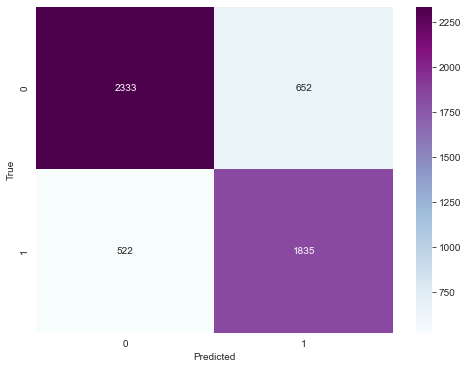

In [ ]:
# setting best parameter

ada2 = [{'ADA__learning_rate': [0.5,],
         'ADA__n_estimators': [85]}]

# setting the gridsearch

adaboost_best = GridSearchCV(estimator=scaled_pipeline3, 
                          param_grid= ada2,
                          scoring='accuracy', 
                          cv=6)

fit_train_score(adaboost_best)

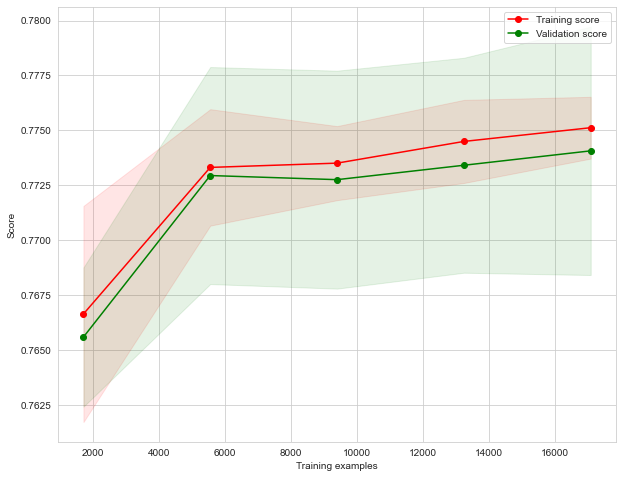

In [ ]:
# plotting the learning curve

learning_curve(adaboost_best)

### <span style ='color : orange ' > XGBoost Classifier</span>

Model Train accuracy: 0.771
Model Test accuracy: 0.774
Cross Validation Accuracy: 76.864%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.78      0.81      0.79      2855
         1.0       0.77      0.73      0.75      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.77      0.77      5342
weighted avg       0.77      0.77      0.77      5342



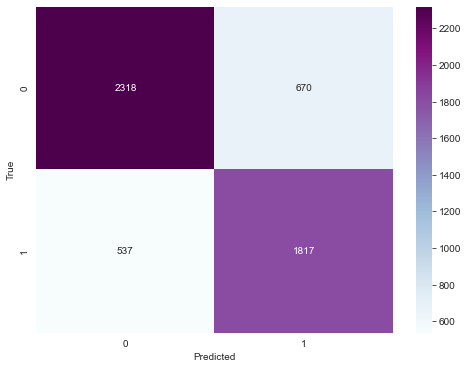

In [ ]:

# setting up the pipeline

scaled_pipeline4 = Pipeline([('scaler', StandardScaler()), ('xgb', XGBClassifier())])

# Setting up the parameter grid for a grid search:

xgb = [{'xgb__eta': [0.2, 0.3],
         'xgb__gamma': [49, 50],
         'xgb__max_depth': [5],
         'xgb__subsample': [0.1, 0.2, 0.3],
         'xgb__booster': ['gbtree']}]

# Performing grid search cross-validation:

xgboost1 = GridSearchCV(estimator=scaled_pipeline4, param_grid=xgb, scoring='accuracy', cv=5)

# Fitting the training data and scoring the model:
fit_train_score(xgboost1)

In [ ]:
# getting the best parameters

xgboost1.best_params_

{'xgb__booster': 'gbtree',
 'xgb__eta': 0.3,
 'xgb__gamma': 49,
 'xgb__max_depth': 5,
 'xgb__subsample': 0.3}

### <span style ='color : orange ' > XGBoost Classifier with best parameters </span>

Model Train accuracy: 0.771
Model Test accuracy: 0.774
Cross Validation Accuracy: 76.864%


*********************************** 

              precision    recall  f1-score   support

         0.0       0.78      0.81      0.79      2855
         1.0       0.77      0.73      0.75      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.77      0.77      5342
weighted avg       0.77      0.77      0.77      5342



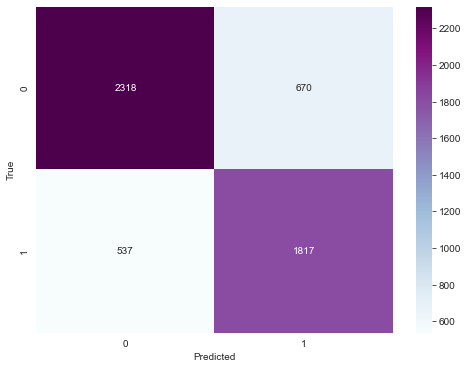

In [ ]:
# Setting up the parameter grid 

xgb1 = [{'xgb__eta': [0.3],
         'xgb__gamma': [49],
         'xgb__max_depth': [4],
         'xgb__subsample': [0.3],
         'xgb__booster': ['gbtree']}]

# Performing grid search

xgboost1_best = GridSearchCV(estimator=scaled_pipeline4, param_grid=xgb1, scoring='accuracy', cv=6)

# Fitting the training data and scoring the model:
fit_train_score(xgboost1_best)

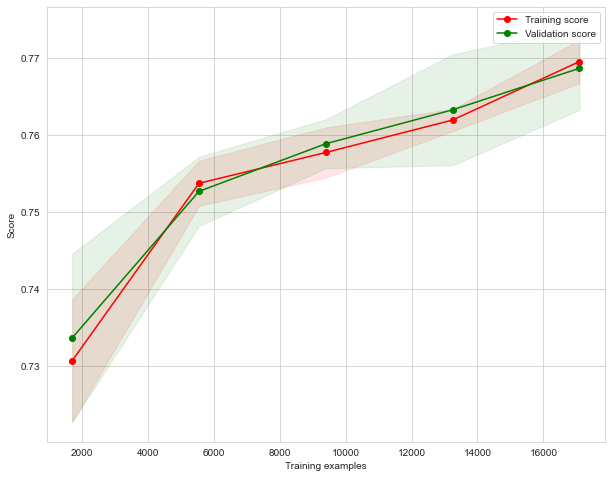

In [ ]:
# plotting the learning curve

learning_curve(xgboost1_best)

### <span style ='color : orange ' > CATBoost Classifier </span>

0:	learn: 0.6553780	total: 67ms	remaining: 5.96s
1:	learn: 0.6255270	total: 81.3ms	remaining: 3.58s
2:	learn: 0.6003056	total: 105ms	remaining: 3.06s
3:	learn: 0.5812416	total: 121ms	remaining: 2.61s
4:	learn: 0.5657260	total: 146ms	remaining: 2.48s
5:	learn: 0.5522365	total: 170ms	remaining: 2.38s
6:	learn: 0.5421686	total: 192ms	remaining: 2.28s
7:	learn: 0.5344765	total: 213ms	remaining: 2.18s
8:	learn: 0.5274141	total: 232ms	remaining: 2.08s
9:	learn: 0.5210105	total: 254ms	remaining: 2.03s
10:	learn: 0.5159141	total: 276ms	remaining: 1.98s
11:	learn: 0.5117514	total: 300ms	remaining: 1.95s
12:	learn: 0.5079067	total: 440ms	remaining: 2.61s
13:	learn: 0.5047685	total: 469ms	remaining: 2.55s
14:	learn: 0.5028726	total: 579ms	remaining: 2.9s
15:	learn: 0.5004568	total: 660ms	remaining: 3.05s
16:	learn: 0.4978936	total: 725ms	remaining: 3.11s
17:	learn: 0.4955686	total: 830ms	remaining: 3.32s
18:	learn: 0.4934352	total: 893ms	remaining: 3.34s
19:	learn: 0.4919498	total: 959ms	remainin

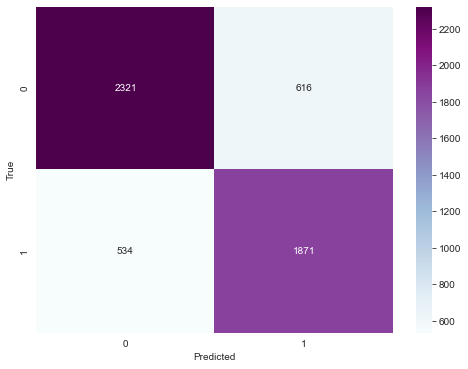

In [ ]:
# importing the necessary libraries

from catboost import CatBoostClassifier

# setting up the pipeline

scaled_pipeline5 = Pipeline([('scaler', StandardScaler()), 
                             ('cat', CatBoostClassifier())])

# setting up the grid parameters

cat1 = [{'cat__n_estimators':[len(range(10,100))],
        'cat__eta': [0.1, 0.2, 0.3, 0.4],
        'cat__max_depth': [5, 6],
        'cat__bootstrap_type': ['Bayesian', 'Bernoulli']}]

# setting up the grid search

cat1_grid = GridSearchCV(estimator=scaled_pipeline5, param_grid= cat1, scoring='accuracy', cv=6) 

# training and testing

fit_train_score(cat1_grid)



In [ ]:
cat1_grid.best_params_

{'cat__bootstrap_type': 'Bayesian',
 'cat__eta': 0.1,
 'cat__max_depth': 6,
 'cat__n_estimators': 90}

### <span style ='color : orange ' > CATBoost Classifier with best parameters</span>

0:	learn: 0.6541402	total: 12.6ms	remaining: 1.13s
1:	learn: 0.6224410	total: 24.4ms	remaining: 1.07s
2:	learn: 0.5972236	total: 37.7ms	remaining: 1.09s
3:	learn: 0.5771709	total: 51.5ms	remaining: 1.11s
4:	learn: 0.5619456	total: 64.4ms	remaining: 1.09s
5:	learn: 0.5483512	total: 77.2ms	remaining: 1.08s
6:	learn: 0.5382591	total: 88.9ms	remaining: 1.05s
7:	learn: 0.5290003	total: 105ms	remaining: 1.07s
8:	learn: 0.5217706	total: 117ms	remaining: 1.05s
9:	learn: 0.5170607	total: 133ms	remaining: 1.06s
10:	learn: 0.5115127	total: 148ms	remaining: 1.06s
11:	learn: 0.5069262	total: 164ms	remaining: 1.07s
12:	learn: 0.5036969	total: 211ms	remaining: 1.25s
13:	learn: 0.5005194	total: 227ms	remaining: 1.23s
14:	learn: 0.4976192	total: 247ms	remaining: 1.24s
15:	learn: 0.4951498	total: 283ms	remaining: 1.31s
16:	learn: 0.4924049	total: 311ms	remaining: 1.33s
17:	learn: 0.4900073	total: 338ms	remaining: 1.35s
18:	learn: 0.4883468	total: 378ms	remaining: 1.41s
19:	learn: 0.4865670	total: 400ms	

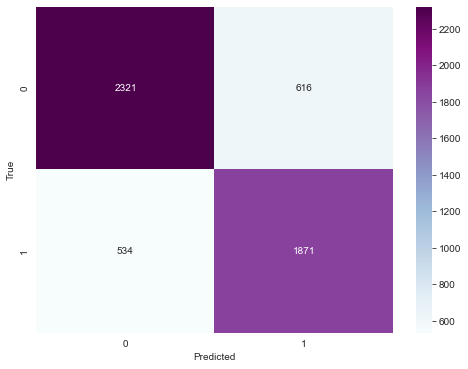

In [ ]:
# setting up the grid parameters

cat1 = [{'cat__n_estimators':[90],
        'cat__eta': [0.1],
        'cat__max_depth': [6],
        'cat__bootstrap_type': ['Bayesian']}]

# setting up the grid search

cat1_grid_best = GridSearchCV(estimator=scaled_pipeline5, param_grid= cat1, scoring='accuracy', cv=6) 

# training and testing

fit_train_score(cat1_grid_best)

0:	learn: 0.6572870	total: 3.97ms	remaining: 353ms
1:	learn: 0.6225201	total: 10.2ms	remaining: 447ms
2:	learn: 0.5882759	total: 15ms	remaining: 434ms
3:	learn: 0.5684217	total: 18.7ms	remaining: 403ms
4:	learn: 0.5509539	total: 24.4ms	remaining: 415ms
5:	learn: 0.5382947	total: 30.4ms	remaining: 425ms
6:	learn: 0.5252486	total: 34.1ms	remaining: 404ms
7:	learn: 0.5143398	total: 37.9ms	remaining: 389ms
8:	learn: 0.5063309	total: 42.8ms	remaining: 385ms
9:	learn: 0.4989461	total: 46.7ms	remaining: 374ms
10:	learn: 0.4884890	total: 50.5ms	remaining: 363ms
11:	learn: 0.4802529	total: 56.7ms	remaining: 369ms
12:	learn: 0.4716166	total: 60.8ms	remaining: 360ms
13:	learn: 0.4667184	total: 64.7ms	remaining: 351ms
14:	learn: 0.4627076	total: 69.5ms	remaining: 347ms
15:	learn: 0.4577959	total: 73.5ms	remaining: 340ms
16:	learn: 0.4537877	total: 77.3ms	remaining: 332ms
17:	learn: 0.4498468	total: 81.4ms	remaining: 325ms
18:	learn: 0.4448311	total: 129ms	remaining: 482ms
19:	learn: 0.4417470	tota

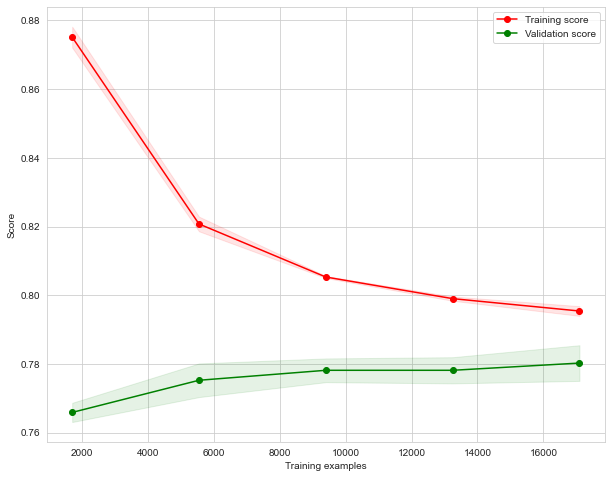

In [ ]:
# plotting the learning curve

learning_curve(cat1_grid_best)

In [ ]:
# Define the array of values
data = np.array([[0.997,0.692,0.68], [0.77, 0.77, 0.7692], [0.78, 0.78, 0.7766], [0.75, 0.78, 0.7740], [0.77, 0.77, 0.7684], [0.793, 0.785, 0.78]])

# Define the column names
index = ['Decision_tree', 'Random_forest', 'Gradient_boosting', 'AdaBoosting', 'XGBoost','CATBoost']

# Define the row names or index labels
columns = ['Model_Train_Accuracy', 'Model_Test_Accuracy', 'Cross_Validation_Accuracy']

# Create the DataFrame
scores_df = pd.DataFrame(data, columns=columns, index=index)

# Display the DataFrame
scores_df.head(10)





,Model_Train_Accuracy,Model_Test_Accuracy,Cross_Validation_Accuracy
Decision_tree,0.997,0.692,0.6800
Random_forest,0.770,0.770,0.7692
Gradient_boosting,0.780,0.780,0.7766
AdaBoosting,0.750,0.780,0.7740
XGBoost,0.770,0.770,0.7684
CATBoost,0.793,0.785,0.7800
